In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Acquiring Data
closing_price = pd.read_excel("closing_price.xlsx", sheet_name=0)
KO_days = pd.read_excel("knock-out.xlsx", sheet_name=0)
closing_price['BEG_DATE'] = pd.to_datetime(closing_price['BEG_DATE']).dt.date
KO_days['OB_DATE'] = pd.to_datetime(KO_days['OB_DATE']).dt.date
trading_days = closing_price['BEG_DATE']
observation_days = KO_days['OB_DATE']

#初始设定
coupon_rate = 0.2
principal = 100
paths = 1000
r = 0.03
sigma = 0.2
log_K_out = np.log(1.03)
log_K_in = np.log(0.75)

print("标的指数：000852")
print("敲出边界: log(1.03): ", log_K_out)
print("敲入边界: log(0.75): ", log_K_in)

FileNotFoundError: [Errno 2] No such file or directory: 'closing_price.xlsx'

In [35]:
# Find the next trading day for observation days that are not trading days
def find_next_trading_day(observation_day, trading_days):
    if observation_day in trading_days:
        return observation_day
    else:
        next_trading_days = trading_days[trading_days > observation_day]
        if len(next_trading_days) > 0:
            next_trading_day = min(next_trading_days)
            return next_trading_day
        else:
            return observation_day
next_trading_days = [find_next_trading_day(observation_day, trading_days) for observation_day in observation_days]

# Update the observation days with the next trading days
observation_days = np.where(~KO_days['OB_DATE'].isin(trading_days), next_trading_days, observation_days) #如条件为true，就是不在trading days，选next_trading_day作为返回值

In [27]:
observation_days = pd.DataFrame({'Date': pd.to_datetime(observation_days)})
observation_days.set_index('Date', inplace=True)
trading_days = pd.DataFrame({'Date': pd.to_datetime(trading_days)})
trading_days.set_index('Date', inplace=True)

In [36]:
class PricePathsSimulator: #定义一个类
    def __init__(self, start_date, end_date, historical_prices, paths, steps, r, sigma, log_K_out, log_K_in): #声明该类的变量
        self.start_date = start_date #开始时间
        self.end_date = end_date #结束时间
        self.historical_prices = historical_prices #历史价格数据
        self.paths = paths #路径数量
        self.steps = steps #time interval
        self.r = r #无风险利率
        self.sigma = sigma #波动率
        self.log_K_out = log_K_out #敲出边界
        self.log_K_in = log_K_in #敲入边界
        self.price_path_df = None  # Initialize as None

    def convert_historical(self):
        price_realize = pd.Series(self.historical_prices)
        pct_historical = np.log(1 + price_realize.pct_change()).dropna()
        pct_historical = pd.DataFrame(pct_historical)
        #pct_historical.columns = [0]
        pct_historical_price = np.cumsum(pct_historical, axis=0)
        pct_historical_price_index = trading_days[trading_days.index < pd.to_datetime(valuation_date)].index
        pct_historical_price.index = pct_historical_price_index
        pct_historical = np.array(pct_historical_price.values)

        return pct_historical, pct_historical_price_index
    def generate_price_paths(self): #生成价格路径
        status_01 = []
        status_02 = []
        status = []
        payoff = []
        option_price = []
        prestatus = 0
        ob_list = list(observation_days[observation_days.index < pd.to_datetime(valuation_date)].index) #转换成list这样可以进行for loop
        tr_list = list(trading_days[trading_days.index < pd.to_datetime(valuation_date)].index)
        pct_historical, pct_historical_price_index = self.convert_historical()

        # Check for knock-out events before the valuation date
        if len(ob_list) > 0:
            print("先执行一次price_date之前的日期判断是否敲出")
            for date in ob_list:
                date_index = np.where(pct_historical_price_index == date)[0][0] #元组里的第一个元素的值
                if pct_historical[date_index] >= self.log_K_out: #用date_index 定位到对应日期的历史数据
                    payoff = ((date - start_date).days/365) * coupon_rate * principal
                    option_price = principal + payoff
                    prestatus = 0
                    status.append(str(date) + " 估值日前敲出，期权价格为" + option_price)

        if len(tr_list) > 0:
            print("先执行一次price_date之前的日期判断是否敲入")
            for date in tr_list:
                date_index = np.where(pct_historical_price_index == date)[0][0]  # comparison is done with a single date value; only be one matching index
                if pct_historical[date_index] <= self.log_K_in:
                    prestatus = 1
                    status_01.append(str(date) + "估值日前发生敲入,下面进行蒙特卡洛模拟")# 敲入记录状态
                    break

                else:
                    prestatus = 2
                    status_02.append("估值日前无敲入敲出,下面进行蒙特卡洛模拟")

        if len(status_01) > 0 or len(status_02): #为什么可以取len(status_01)？status是什么数据结构
            if prestatus == 1:
                print(status_01[-1])
            else:
                if prestatus == 2:
                    print(status_02[0])

        if prestatus >= 1:

            T = (self.end_date - self.start_date).days / 365
            historical_prices_series = pd.Series(self.historical_prices)
            log_prices = np.log(1 + historical_prices_series.pct_change()).dropna()
            cumulative_log_prices = np.cumsum(log_prices, axis=0)

            epsilon = np.random.randn(steps, paths) #生成一个随机矩阵 steps：rows, paths: columns
            cumulative_returns = ((r - 0.5 * sigma ** 2) * (T / steps) + sigma * np.sqrt(T / steps) * epsilon)
            cumulative_log_returns = np.cumsum(cumulative_returns, axis=0) #cumulative_log_returns 中的每个元素代表蒙特卡洛模拟生成的额外对数收益。
            log_price_paths = cumulative_log_prices.iloc[-1] + cumulative_log_returns #The calculation 逐元素进行

            date_range = trading_days[trading_days.index >= valuation_date]

            price_path_df = pd.DataFrame(log_price_paths,
                                         columns=['Path ' + str(i) for i in range(log_price_paths.shape[1])])
            #print('price_path_df', price_path_df)
            price_path_df['日期'] = date_range.index
            date_column = price_path_df.pop('日期')
            price_path_df.insert(0, '日期', date_column)
            price_path_df.index = valuation_dates.index
            price_path_df.index.name = 'Date'
            price_path_df.to_excel('price_paths_update.xlsx', index=False)
            self.price_path_df = price_path_df

            plt.figure(figsize=(10, 6))
            plt.plot(valuation_dates.index, log_price_paths, label="Simulated Log Price Paths")
            plt.title('Simulated Log Price Paths')
            plt.xlabel('Date')
            plt.ylabel('Log Price')
            plt.show()
    def snowball(self, observation_days, trading_days, log_K_out, log_K_in, coupon_rate, principal, T):
        pct_historical = self.convert_historical()
        num_paths = self.price_path_df.shape[1]-1
        status = []
        option_prices = []

        for path in range(1, num_paths+1):
            ps = self.price_path_df.iloc[:, path] #select all rows and the column at index path
            knock_out_indices = np.where(ps >= self.log_K_out)[0]
            knock_in_indices = np.where(ps <= self.log_K_in)[0]#索引数组
            knock_out_list = observation_days[observation_days.index.isin(valuation_dates.index[knock_out_indices])] #通过索引的位置实现
            knock_in_list = trading_days[trading_days.index.isin(valuation_dates.index[knock_in_indices])]

            if len(knock_out_list) > 0:
                KO_date = knock_out_list.index[0]
                KO_date = pd.Timestamp(KO_date)  # Convert to Timestamp object
                t0 = ((KO_date - pd.Timestamp(valuation_date)).days) / 365
                t1 = ((KO_date - pd.Timestamp(start_date)).days) / 365
                payoff = coupon_rate * (t1 / T) * principal * np.exp(-r * (t0 / T))
                status.append(str(KO_date) + t0 + " 观察日敲出")
            else:
                # Check for knock-in event
                # knock_in_indices = np.where((np.array(trading_days[:ps.shape[0]]) >= valuation_date) & (ps <= log_K_in))[0]
                if len(knock_in_list) > 0:
                    t0 = ((end_date - valuation_date).days) / 365
                    payoff = min((np.exp(ps.iloc[-1])) - 1, 0) * principal * np.exp(-r * (t0 / T))
                    status.append(str(end_date) + " 敲入未敲出")
                else:
                    # Check if knock-in has already occurred in historical prices
                    historical_knock_in_indices = np.where(pct_historical[0] <= self.log_K_in)[0]
                    if len(historical_knock_in_indices) > 0:
                        t0 = ((end_date - valuation_date).days) / 365
                        payoff = min((np.exp(ps.iloc[-1])) - 1, 0) * principal * np.exp(-r * (t0 / T))#
                        status.append(str(end_date) + " 已敲入")
                    else:
                        t0 = ((end_date - valuation_date).days) / 365
                        payoff = coupon_rate * principal * np.exp(-r * (t0 / T))
                        status.append(str(end_date) + "无敲入无敲出")

            option_price = payoff + principal * np.exp(-r * T)
            option_prices.append(option_price)
        mean_price = np.mean(option_prices) #输出美化
        print("期权价格", mean_price)
        #print("状态：进行蒙特卡洛模拟")

        result_df = pd.DataFrame({
            'Option Price': option_prices,
            'Status': status
        })
        # Excel
        result_df.to_excel('option_pricing_results_update.xlsx', index=False)
        self.result_df = result_df
        return result_df

先执行一次price_date之前的日期判断是否敲出
先执行一次price_date之前的日期判断是否敲入
2018-10-10 00:00:00估值日前发生敲入,下面进行蒙特卡洛模拟


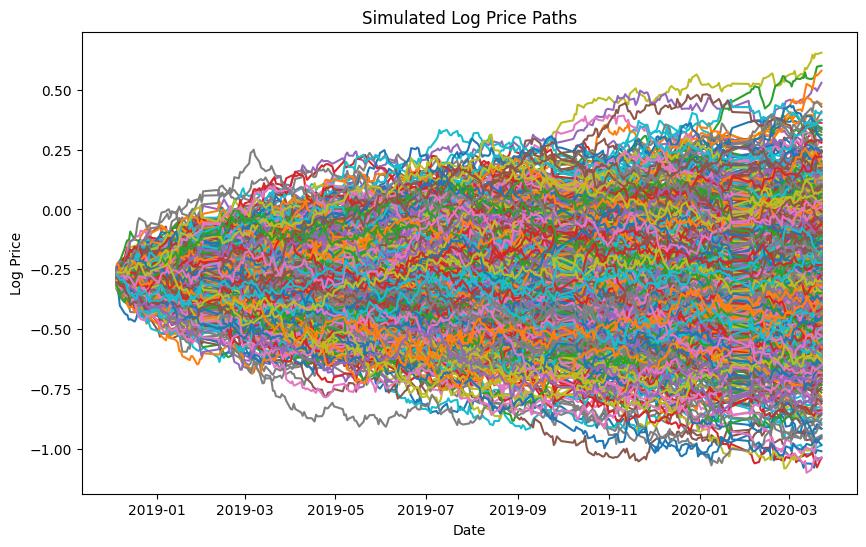

期权价格 75.55249487263815


In [30]:
# 调用
start_date = pd.to_datetime('2018-03-23')
end_date = pd.to_datetime('2020-03-23')
T = (end_date - start_date).days / 365

valuation_date = pd.to_datetime('2018-12-05')
valuation_dates = trading_days[trading_days.index >= valuation_date]

historical_prices = closing_price[closing_price['BEG_DATE'] <= valuation_date.date()]['I_CLOSE'].values
steps = len(trading_days[trading_days.index >= valuation_date])

#类
simulator = PricePathsSimulator(start_date, end_date, historical_prices, paths, steps, r, sigma, log_K_out, log_K_in)
simulator.convert_historical()#函数1
simulator.generate_price_paths() #函数2
# Obtain the generated price paths DataFrame
result_df = simulator.snowball(observation_days, trading_days, log_K_out, log_K_in, coupon_rate, principal, T)# 函数3
#print(result_df)


In [31]:
simulator.price_path_df

日期    Path 0    Path 1    Path 2    Path 3    Path 4  \
Date                                                                      
2018-12-05 2018-12-05 -0.291051 -0.248661 -0.275457 -0.265849 -0.307775   
2018-12-06 2018-12-06 -0.337728 -0.244825 -0.262914 -0.265934 -0.338606   
2018-12-07 2018-12-07 -0.309291 -0.253874 -0.260207 -0.257264 -0.337518   
2018-12-10 2018-12-10 -0.293159 -0.273228 -0.261933 -0.239298 -0.352077   
2018-12-11 2018-12-11 -0.335408 -0.264152 -0.241666 -0.255365 -0.361461   
2018-12-12 2018-12-12 -0.325425 -0.273389 -0.226209 -0.261756 -0.327223   
2018-12-13 2018-12-13 -0.298120 -0.288396 -0.227327 -0.272125 -0.332423   
2018-12-14 2018-12-14 -0.304753 -0.276974 -0.244538 -0.292833 -0.343268   
2018-12-17 2018-12-17 -0.302442 -0.284396 -0.230426 -0.286886 -0.331926   
2018-12-18 2018-12-18 -0.303403 -0.263914 -0.247361 -0.296784 -0.334919   
2018-12-19 2018-12-19 -0.306403 -0.285115 -0.238911 -0.303182 -0.357210   
2018-12-20 2018-12-20 -0.315295 -0.277049 -0.239365 -0.297133 -0.375103   
2018-12-21 2018-12-21 -0.309115 -0.313794 -0.212986 -0.291684 -0.366782   
2018-12-24 2018-12-24 -0.299589 -0.315131 -0.203830 -0.285923 -0.389165   
2018-12-25 2018-12-25 -0.307680 -0.322343 -0.200190 -0.278243 -0.391694   
2018-12-26 2018-12-26 -0.298186 -0.327359 -0.197866 -0.265658 -0.363885   
2018-12-27 2018-12-27 -0.301893 -0.329353 -0.176182 -0.269573 -0.333767   
2018-12-28 2018-12-28 -0.316579 -0.325912 -0.199822 -0.257243 -0.344940   
2019-01-02 2019-01-02 -0.298783 -0.327536 -0.178927 -0.273196 -0.344035   
2019-01-03 2019-01-03 -0.251994 -0.321967 -0.174349 -0.268307 -0.322957   
2019-01-04 2019-01-04 -0.260490 -0.319805 -0.181972 -0.275369 -0.307954   
2019-01-07 2019-01-07 -0.257531 -0.333567 -0.197866 -0.263623 -0.319686   
2019-01-08 2019-01-08 -0.278282 -0.322542 -0.220833 -0.274701 -0.322673   
2019-01-09 2019-01-09 -0.282635 -0.321871 -0.221533 -0.265150 -0.314999   
2019-01-10 2019-01-10 -0.269200 -0.302791 -0.214848 -0.274957 -0.314340   
2019-01-11 2019-01-11 -0.260912 -0.272903 -0.204558 -0.255845 -0.341351   
2019-01-14 2019-01-14 -0.250017 -0.274128 -0.201496 -0.220966 -0.366107   
2019-01-15 2019-01-15 -0.261233 -0.264428 -0.191463 -0.219828 -0.346671   
2019-01-16 2019-01-16 -0.284176 -0.274644 -0.227532 -0.205068 -0.347387   
2019-01-17 2019-01-17 -0.290536 -0.280068 -0.231620 -0.193616 -0.336253   
2019-01-18 2019-01-18 -0.305156 -0.258759 -0.247475 -0.192735 -0.332935   
2019-01-21 2019-01-21 -0.307131 -0.243810 -0.259400 -0.199374 -0.324126   
2019-01-22 2019-01-22 -0.289126 -0.237599 -0.238735 -0.190712 -0.334099   
2019-01-23 2019-01-23 -0.269478 -0.242505 -0.223759 -0.164518 -0.324230   
2019-01-24 2019-01-24 -0.246584 -0.255551 -0.240571 -0.110671 -0.301252   
2019-01-25 2019-01-25 -0.270713 -0.269825 -0.241277 -0.077539 -0.313544   
2019-01-28 2019-01-28 -0.288265 -0.238713 -0.231417 -0.079663 -0.272708   
2019-01-29 2019-01-29 -0.289209 -0.255453 -0.229439 -0.051511 -0.257976   
2019-01-30 2019-01-30 -0.261526 -0.247390 -0.221716 -0.036881 -0.296158   
2019-01-31 2019-01-31 -0.275362 -0.222992 -0.232205 -0.045302 -0.318114   
2019-02-01 2019-02-01 -0.279540 -0.218072 -0.209157 -0.040295 -0.290846   
2019-02-11 2019-02-11 -0.290753 -0.232350 -0.208613 -0.040519 -0.313824   
2019-02-12 2019-02-12 -0.278300 -0.217683 -0.172397 -0.042944 -0.317300   
2019-02-13 2019-02-13 -0.259334 -0.182194 -0.180382 -0.042473 -0.329838   
2019-02-14 2019-02-14 -0.260709 -0.183723 -0.174816 -0.042390 -0.316068   
2019-02-15 2019-02-15 -0.234514 -0.192737 -0.159244 -0.009109 -0.336200   
2019-02-18 2019-02-18 -0.249538 -0.190402 -0.154612 -0.019091 -0.346277   
2019-02-19 2019-02-19 -0.267288 -0.159025 -0.178040 -0.020242 -0.325089   
2019-02-20 2019-02-20 -0.292953 -0.163531 -0.141307 -0.025496 -0.332333   
2019-02-21 2019-02-21 -0.315992 -0.141371 -0.166901 -0.036156 -0.348590   
2019-02-22 2019-02-22 -0.298160 -0.154126 -0.187870 -0.036928 -0.353732   
2019-02-25 2019-02-25 -0.307689 -0.149633 -0

In [37]:
simulator.result_df

,Option Price,Status
0,73.107016,2020-03-23 00:00:00 敲入未敲出
1,106.596552,2019-06-24 00:00:00 观察日敲出
2,57.413920,2020-03-23 00:00:00 敲入未敲出
3,109.802064,2019-10-23 00:00:00 观察日敲出
4,112.217844,2020-01-23 00:00:00 观察日敲出
5,107.367749,2019-07-23 00:00:00 观察日敲出
6,88.692124,2020-03-23 00:00:00 敲入未敲出
7,71.760286,2020-03-23 00:00:00 敲入未敲出
8,92.039117,2020-03-23 00:00:00 敲入未敲出
9,73.621184,2020-03-23 00:00:00 敲入未敲出
